# Research Notebook for dataset

## Import Modules

In [1]:
import sqlite3
import pandas as pd
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

from sklearn.linear_model import LogisticRegression

from pathlib import Path
import joblib

pd.options.display.max_columns = 50
pd.options.display.max_rows = 20

print("Imported the modules.")

Imported the modules.


## Extracting Data from given data_file

1. Defining function to initiate connection to database using sqlite3.
2. Defining function to pass SQL syntax and convert the obtained data as a pandas Dataframe.

In [2]:
# Defining function to initiate connection to database using sqlite3.
# Defining function to pass SQL syntax and convert the obtained data as a pandas Dataframe.

def initiate_local_connection():
    try:
        conn = sqlite3.connect(file_name)
        print('[+] Local Connection Successful')
    except Exception as e:
        print(f'[+] Local Connection Failed: {e}')
        conn = None

    return conn

def get_records(sql_query):
    try:
        # create a cursor object and execute the given SQL syntax 
        cursor = conn.cursor()
        cursor.execute(sql_query)

        # Fetch all the records from SQL query output
        results = cursor.fetchall()
        
        # Convert results into pandas dataframe
        df = pd.DataFrame(results)
        
        print(f'Successfully retrieved records')
        
        return df
        
    except Exception as e:
        print(f'Error encountered: {e}')

* Defining the file name and data path to establish a connection.

In [3]:
file_name = "data/calls.db"

conn = initiate_local_connection()


[+] Local Connection Successful


* Defining SQL syntax for data extraction from data source. 
* Using `get_records()` to obtain a pandas Dataframe.

In [4]:
sql_query = f'SELECT * FROM calls'

df = get_records(sql_query)


Successfully retrieved records


# Data Analysis

* First Look at dataset that we are provided

In [5]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,947429,-719,12,42.130000,Suspicious,Yes,1,95,Voip,2023-07-23 09:04:00,Fully Charged,Scam
1,540498,116,3,29.900000,Unlikely,Yes,0,91,Mobile,2023-09-05 20:11:00,Fully Charged,Scam
2,434243,29,16,723.460000,Very Suspicious,Yes,2,91,Voip,2023-12-16 11:03:00,Charging,Scam
3,903537,-563,4,64.287478,Unlikely,Yes,3,91,Telegram,2023-02-25 10:41:00,Fully Charged,Not Scam
4,969179,312,19,0.000000,Unlikely,Yes,0,91,Telegram,2023-11-10 15:53:00,Fully Charged,Scam


* Columns of dataset have no name.
* Rename columns according to list of attributes given.

In [6]:
# Assigning column names based on assignment write up.

df = df.rename(columns = {
                    0: 'ID',
                    1: 'Call_Duration',
                    2: 'Call_Frequency',
                    3: 'Financial_Loss',
                    4: 'Flagged_by_Carrier',
                    5: 'Is_International',
                    6: 'Previous_Contact_Count',
                    7: 'Country_Prefix',
                    8: 'Call_Type',
                    9: 'Timestamp',
                    10: 'Device_Battery',
                    11: 'Scam_Call'
                    })

df

,ID,Call_Duration,Call_Frequency,Financial_Loss,Flagged_by_Carrier,Is_International,Previous_Contact_Count,Country_Prefix,Call_Type,Timestamp,Device_Battery,Scam_Call
0,947429,-719,12,42.130000,Suspicious,Yes,1,95,Voip,2023-07-23 09:04:00,Fully Charged,Scam
1,540498,116,3,29.900000,Unlikely,Yes,0,91,Mobile,2023-09-05 20:11:00,Fully Charged,Scam
2,434243,29,16,723.460000,Very Suspicious,Yes,2,91,Voip,2023-12-16 11:03:00,Charging,Scam
3,903537,-563,4,64.287478,Unlikely,Yes,3,91,Telegram,2023-02-25 10:41:00,Fully Charged,Not Scam
4,969179,312,19,0.000000,Unlikely,Yes,0,91,Telegram,2023-11-10 15:53:00,Fully Charged,Scam
...,...,...,...,...,...,...,...,...,...,...,...,...
11995,496033,116,15,NaN,Unlikely,Yes,4,7,Voip,2023-05-03 14:32:00,Fully Charged,Not Scam
11996,730960,621,3,11.740000,Suspicious,Yes,0,MM,Landline,2023-08-04 00:16:00,Fully Charged,Scam
11997,806410,-27,4,102.450000,Suspicious,Yes,0,MM,Voip,2024-03-22 01:31:00,Not Charging,Scam
11998,481032,-127,9,NaN,Unlikely,Yes,0,1,Landline,2023-07-11 17:04:00,Charging,Not Scam


* To see overall information of dataset and datatypes
* Financial Loss has missing data (to be imputed with mean value)

In [7]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12000 entries, 0 to 11999
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      12000 non-null  int64  
 1   Call_Duration           12000 non-null  int64  
 2   Call_Frequency          12000 non-null  int64  
 3   Financial_Loss          10597 non-null  float64
 4   Flagged_by_Carrier      12000 non-null  object 
 5   Is_International        12000 non-null  object 
 6   Previous_Contact_Count  12000 non-null  int64  
 7   Country_Prefix          12000 non-null  object 
 8   Call_Type               12000 non-null  object 
 9   Timestamp               12000 non-null  object 
 10  Device_Battery          12000 non-null  object 
 11  Scam_Call               12000 non-null  object 
dtypes: float64(1), int64(4), object(7)
memory usage: 1.1+ MB


* Separate Timestamp Column into Date and Time
* Changing the data types accordingly

In [8]:
# Split Timestamp information into Date and Time columns
df[['Date','Time']] = df['Timestamp'].str.split(' ',expand=True)
df['Date'] = pd.to_datetime(df['Date'], format="%Y-%m-%d")
df['Time'] = pd.to_datetime(df['Time'])

# Extracting year, month and day individually to assess seasonality of dataset 
# i.e. Are there more calls made in a particular month or day?
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df

,ID,Call_Duration,Call_Frequency,Financial_Loss,Flagged_by_Carrier,Is_International,Previous_Contact_Count,Country_Prefix,Call_Type,Timestamp,Device_Battery,Scam_Call,Date,Time,Year,Month,Day
0,947429,-719,12,42.130000,Suspicious,Yes,1,95,Voip,2023-07-23 09:04:00,Fully Charged,Scam,2023-07-23,2024-04-29 09:04:00,2023,7,23
1,540498,116,3,29.900000,Unlikely,Yes,0,91,Mobile,2023-09-05 20:11:00,Fully Charged,Scam,2023-09-05,2024-04-29 20:11:00,2023,9,5
2,434243,29,16,723.460000,Very Suspicious,Yes,2,91,Voip,2023-12-16 11:03:00,Charging,Scam,2023-12-16,2024-04-29 11:03:00,2023,12,16
3,903537,-563,4,64.287478,Unlikely,Yes,3,91,Telegram,2023-02-25 10:41:00,Fully Charged,Not Scam,2023-02-25,2024-04-29 10:41:00,2023,2,25
4,969179,312,19,0.000000,Unlikely,Yes,0,91,Telegram,2023-11-10 15:53:00,Fully Charged,Scam,2023-11-10,2024-04-29 15:53:00,2023,11,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11995,496033,116,15,NaN,Unlikely,Yes,4,7,Voip,2023-05-03 14:32:00,Fully Charged,Not Scam,2023-05-03,2024-04-29 14:32:00,2023,5,3
11996,730960,621,3,11.740000,Suspicious,Yes,0,MM,Landline,2023-08-04 00:16:00,Fully Charged,Scam,2023-08-04,2024-04-29 00:16:00,2023,8,4
11997,806410,-27,4,102.450000,Suspicious,Yes,0,MM,Voip,2024-03-22 01:31:00,Not Charging,Scam,2024-03-22,2024-04-29 01:31:00,2024,3,22
11998,481032,-127,9,NaN,Unlikely,Yes,0,1,Landline,2023-07-11 17:04:00,Charging,Not Scam,2023-07-11,2024-04-29 17:04:00,2023,7,11


* Changing other categorical data accordingly
* Dropping duplicates
* Dropping irrelevant Timestamp as information has been extracted

In [9]:
df['Flagged_by_Carrier'] = df.Flagged_by_Carrier.astype('category')
df['Is_International'] = df.Is_International.astype('category')
df['Country_Prefix'] = df.Country_Prefix.astype('category')
df['Call_Type'] = df.Call_Type.astype('category')
df['Device_Battery'] = df.Device_Battery.astype('category')

df.drop_duplicates(subset='ID', keep='first', inplace=True)
df = df.drop(columns = ['ID','Timestamp'])

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Call_Duration           10000 non-null  int64         
 1   Call_Frequency          10000 non-null  int64         
 2   Financial_Loss          8865 non-null   float64       
 3   Flagged_by_Carrier      10000 non-null  category      
 4   Is_International        10000 non-null  category      
 5   Previous_Contact_Count  10000 non-null  int64         
 6   Country_Prefix          10000 non-null  category      
 7   Call_Type               10000 non-null  category      
 8   Device_Battery          10000 non-null  category      
 9   Scam_Call               10000 non-null  object        
 10  Date                    10000 non-null  datetime64[ns]
 11  Time                    10000 non-null  datetime64[ns]
 12  Year                    10000 non-null  int64  

* Overview of statistical information of the dataset
* Time data is congruent with convention (31 days in total, 12 months, 2 years)

In [10]:
df.describe()

,Call_Duration,Call_Frequency,Financial_Loss,Previous_Contact_Count,Year,Month,Day
count,10000.000000,10000.000000,8865.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,112.394100,10.653800,98.497338,1.855000,2023.196100,5.612500,15.671200
std,284.370395,5.841212,194.332667,1.769545,0.397065,3.556685,8.843162
min,-787.000000,2.000000,-896.400000,0.000000,2023.000000,1.000000,1.000000
25%,9.000000,6.000000,0.000000,0.000000,2023.000000,2.000000,8.000000
50%,47.000000,9.000000,12.749765,1.000000,2023.000000,5.000000,16.000000
75%,288.000000,15.000000,86.129046,3.000000,2023.000000,9.000000,23.000000
max,822.000000,27.000000,1055.440000,8.000000,2024.000000,12.000000,31.000000


* Correlation of features within the dataset

In [11]:
df.corr()

/var/folders/js/fwrm2kcs5993hjm2q5q3kcqw0000gn/T/ipykernel_43825/1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Call_Duration,Call_Frequency,Financial_Loss,Previous_Contact_Count,Year,Month,Day
Call_Duration,1.000000,0.025404,-0.008241,-0.002581,-0.026201,0.021482,0.003180
Call_Frequency,0.025404,1.000000,0.009470,0.002013,-0.012078,0.015455,0.003604
Financial_Loss,-0.008241,0.009470,1.000000,-0.022655,-0.018791,0.018145,0.010180
Previous_Contact_Count,-0.002581,0.002013,-0.022655,1.000000,-0.003367,0.013954,-0.016392
Year,-0.026201,-0.012078,-0.018791,-0.003367,1.000000,-0.498771,-0.018662
Month,0.021482,0.015455,0.018145,0.013954,-0.498771,1.000000,0.007412
Day,0.003180,0.003604,0.010180,-0.016392,-0.018662,0.007412,1.000000


## Visualisations of the dataset

* Pairwise comparison between features
---
Observations:
* Financial Loss at near zero has majortiy of datapoints labelled "Not Scam"

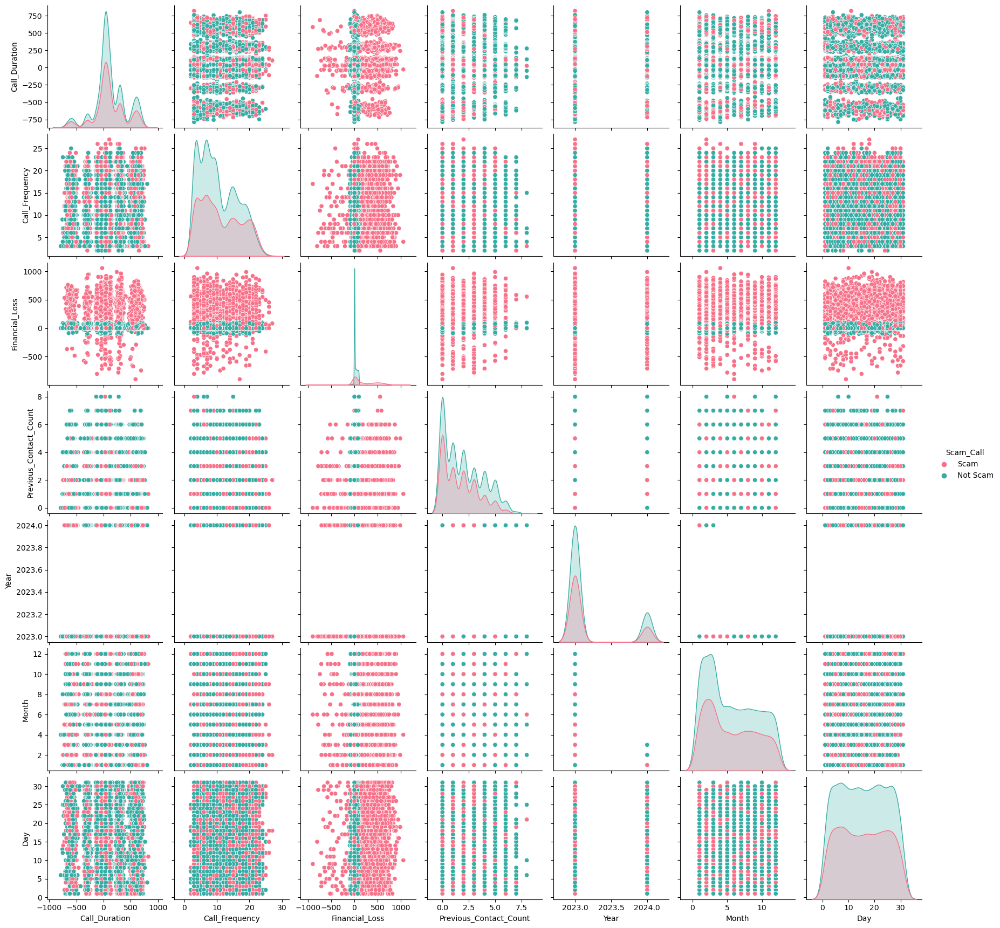

In [12]:
import seaborn as sns
g = sns.pairplot(df, hue="Scam_Call", palette="husl")

### Histograms of features to check distributions

In [13]:
import plotly.express as px

Observations of 'Call_Duration':
* Normal Distribution of data
* Feature should be standardized 

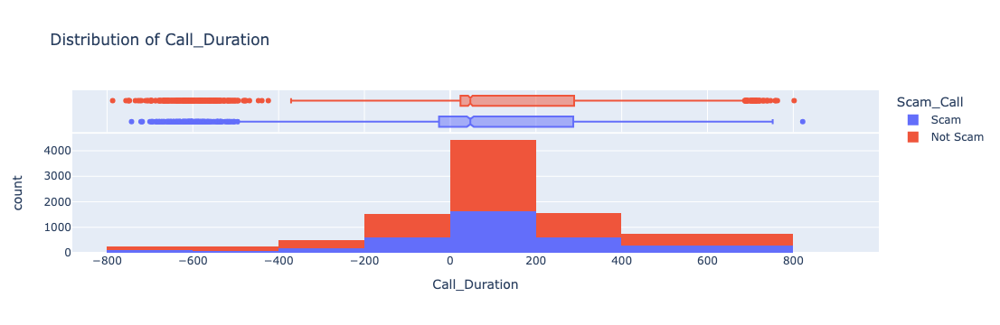

In [14]:
feature = 'Call_Duration'


fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   nbins = 15,
                   marginal = 'box',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Call_Frequency':
* Normal Distribution of data but skewed to the left
* Feature should be standardized
* Logarithm Transformation can be considered

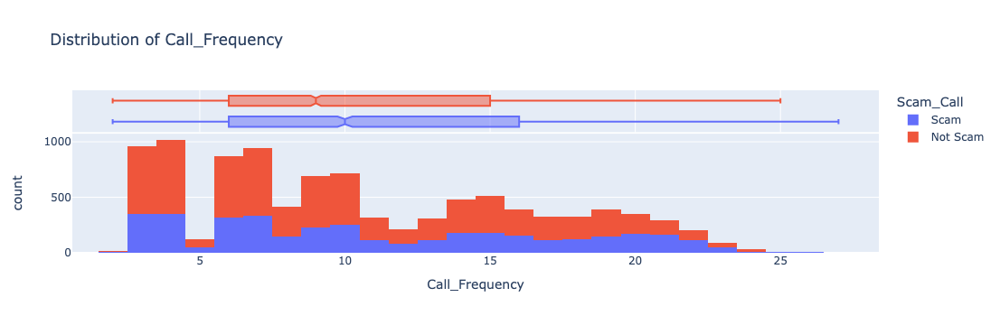

In [15]:
feature = 'Call_Frequency'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   # nbins = 14,
                   marginal = 'box',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Financial_Loss':
* Sharp Peak, majority of "Not Scam" labels found close to center
* Important Feature to be used 

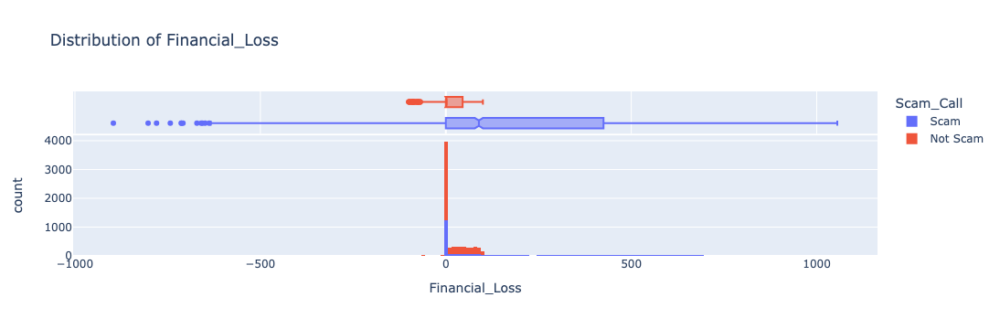

In [16]:
feature = 'Financial_Loss'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   marginal = 'box',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Flagged_by_Carrier':
* Might have possible interaction with international calls, country prefix, call duration, call frequency, previous contact count
* Potential for feature crossing

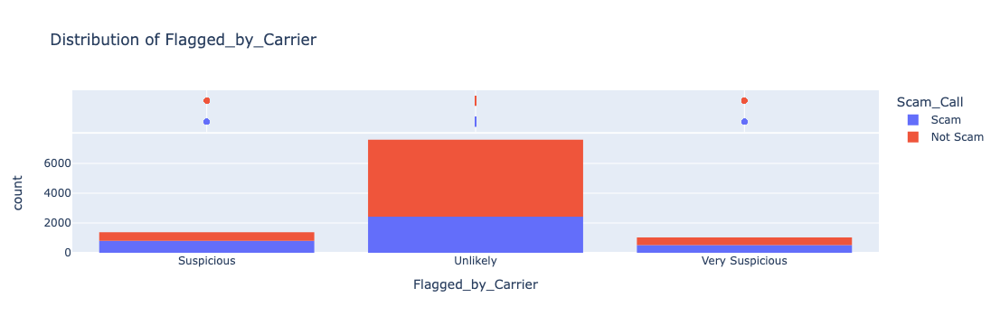

In [17]:
feature = 'Flagged_by_Carrier'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   marginal = 'box',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Is_International':
* Might have possible interaction with carrier flagging, country prefix, call duration, call frequency, previous contact count
* Potential for feature crossing

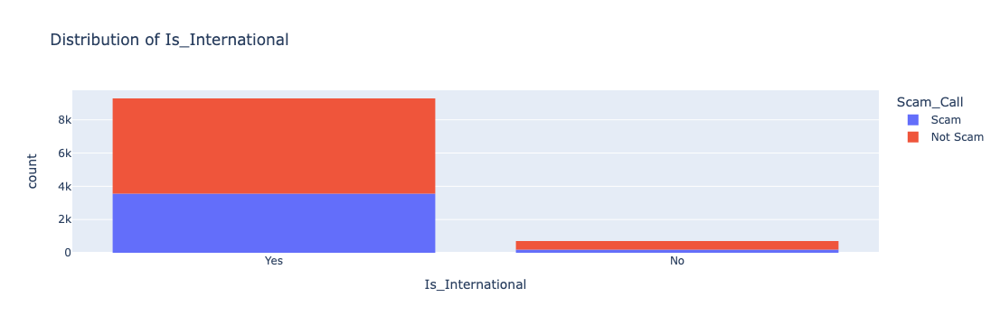

In [18]:
feature = 'Is_International'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Previous_Contact_Count':
* Exponential distribution observed
* Logarithm transformation could be used

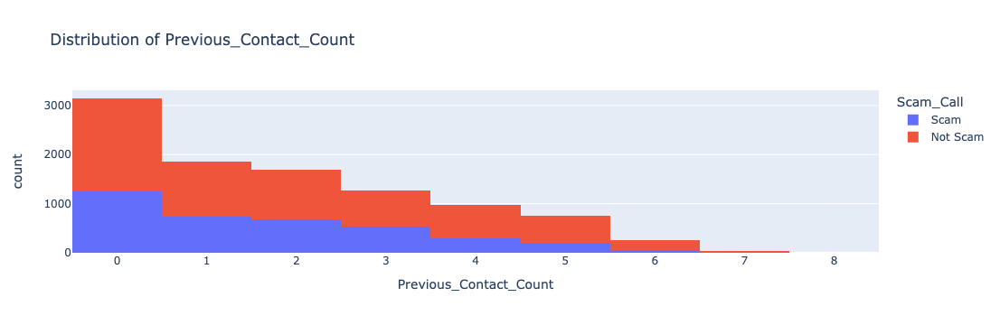

In [19]:
feature = 'Previous_Contact_Count'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Country_Prefix':
* MM is Myanmar country code which is the same as +95
* Values can be combined to gather the true value

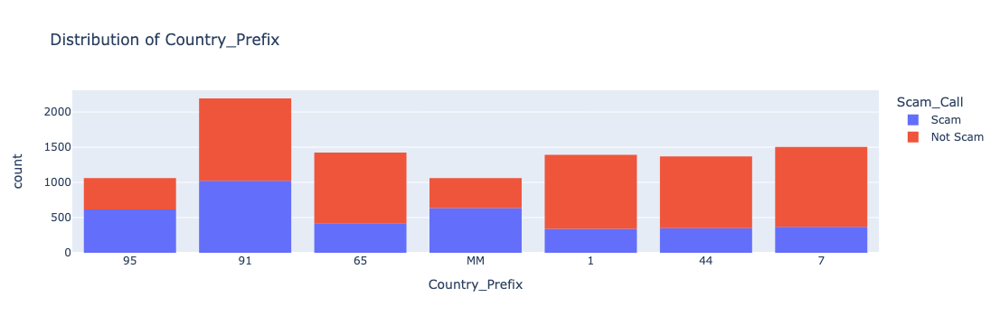

In [20]:
feature = 'Country_Prefix'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Call_Type':

* Whats App is the same as Whatsapp
* Values can be combined to gather the true value 

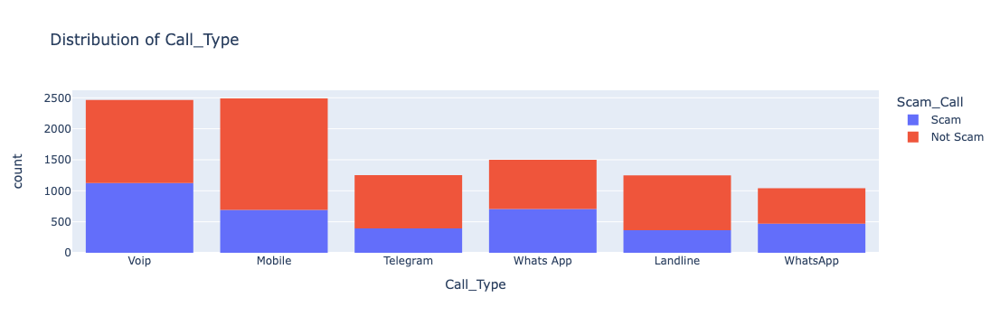

In [21]:
feature = 'Call_Type'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Timestamp':
* Timestamp feature can be split into Date of call and Time of call
* Overall number of calls made per month is around 800. Proportion of Scam and Not Scam is similar
* Values can be combined to gather the true value

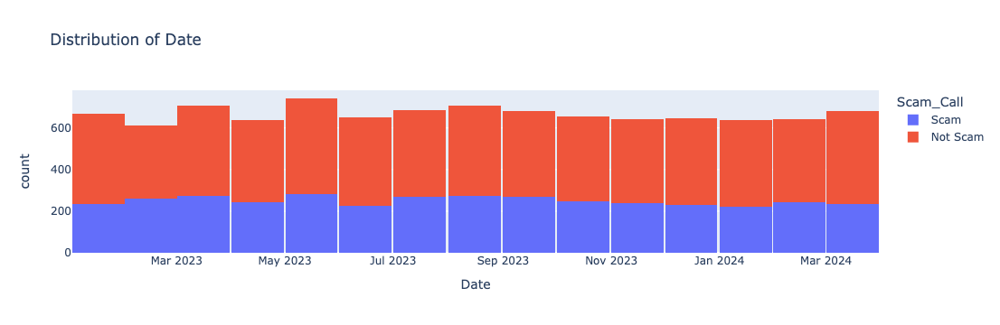

In [22]:
feature = 'Date'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   nbins = 24,
                  title = 'Distribution of ' + feature)

fig.show()

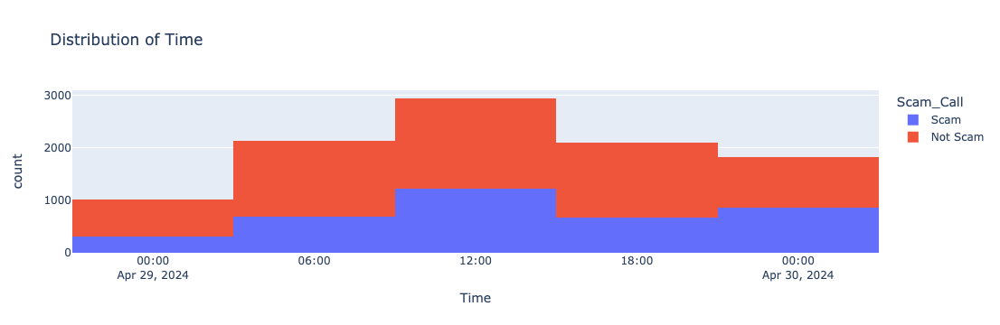

In [23]:
feature = 'Time'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   nbins = 6,
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Device_Type':
* Numbers are distributed evenly amongst the 3 categories. 
* Proportion of Scam and Not Scam are similar as well.

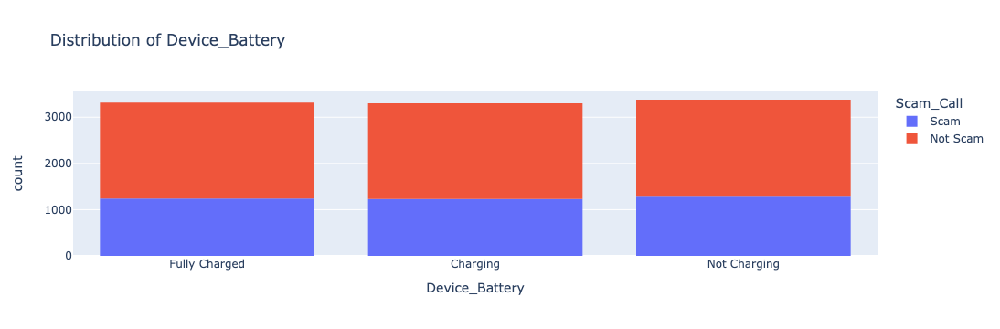

In [24]:
feature = 'Device_Battery'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                  title = 'Distribution of ' + feature)

fig.show()

Observations of 'Month':
* Majority of the calls happen in the 1st quarter. 
* Proportion of Scam and Not Scam are similar throughtout the months.

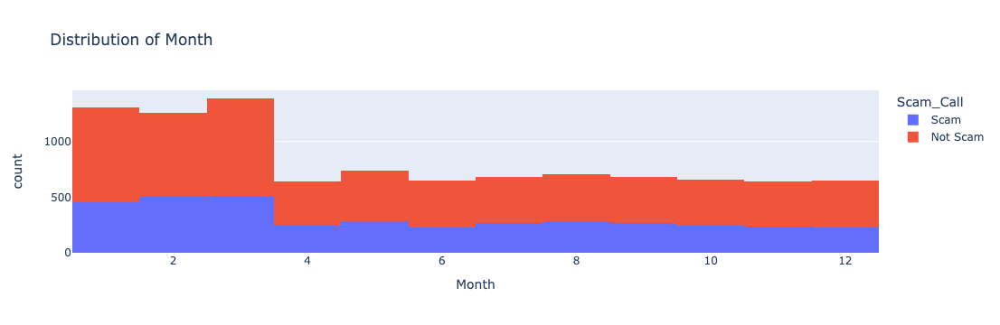

In [25]:
feature = 'Month'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   # nbins = 4,
                  title = 'Distribution of ' + feature)

fig.show()

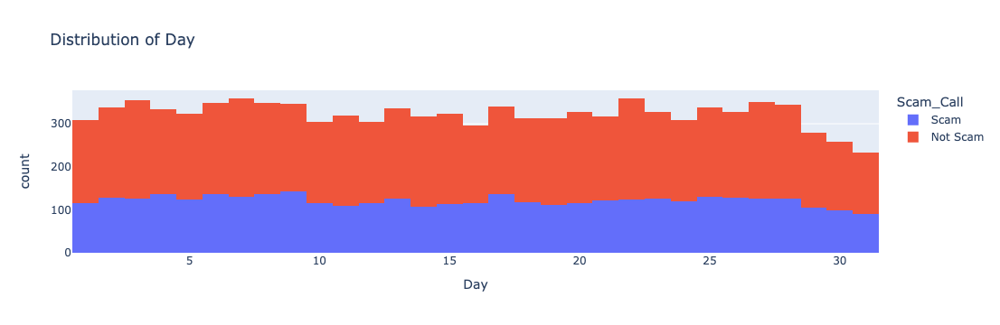

In [26]:
feature = 'Day'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   # nbins = 3,
                  title = 'Distribution of ' + feature)

fig.show()

#### Summary of analysis 

1. Observations of 'Call_Duration':
* Normal Distribution of data
* Feature should be standardized
---
2. Observations of 'Call_Frequency':
* Normal Distribution of data but skewed to the left
* Feature should be standardized
* Logarithm Transformation can be considered
---
3. Observations of 'Financial_Loss':
* Sharp Peak, majority of "Not Scam" labels found close to center
* Important Feature to be used
---
4. Observations of 'Flagged_by_Carrier':
* Might have possible interaction with international calls, country prefix, call duration, call frequency, previous contact count
* Potential for feature crossing
---
5. Observations of 'Is_International':
* Might have possible interaction with carrier flagging, country prefix, call duration, call frequency, previous contact count
* Potential for feature crossing
* Majority of the calls are scam calls compared to non-scam calls, might be an issue in model prediction
---
6. Observations of 'Previous_Contact_Count':
* Exponential distribution observed
* Logarithm transformation could be used
---  
7. Observations of 'Country_Prefix':
* MM is Myanmar country code which is the same as +95
* Values can be combined to gather the true value
---
8. Observations of 'Call_Type':
* Whats App is the same as Whatsapp
* Values can be combined to gather the true value 
---
9. Observations of 'Timestamp':
* Timestamp feature can be split into Date of call and Time of call
* Overall number of calls made per month is around 800. Proportion of Scam and Not Scam is similar
* Values can be combined to gather the true value
---
10. Observations of 'Device_Type':
* Numbers are distributed evenly amongst the 3 categories. 
* Proportion of Scam and Not Scam are similar as well.
* Device Type might be related to country prefix

### Feature engineering

#### Change of values in 'Call_Type' and 'Country_Prefix'

* Replacing 'Whats App' to 'WhatsApp' as they similar meaning
* Country Codes denode a country, "MM" represents Myanmar with has a country code of +95
* Therefore values are replaced accordingly

In [27]:
# Replacing 'Whats App' to 'WhatsApp' since they mean the same thing
df['Call_Type'].replace(['Whats App'],['WhatsApp'], inplace=True)

# country code for mm is Myanmar which is +95 and changing country codes to countries
df['Country_Prefix'].replace(['MM','95', '91', '44', '65', '1', '7'],
                      ['Myanmar','Myanmar', 'India', 'UK', 'Singapore', 'USA', 'Russia'], 
                      inplace=True)

print(df['Call_Type'].unique())
print()
print(df['Country_Prefix'].unique()) 

['Voip', 'Mobile', 'Telegram', 'WhatsApp', 'Landline']
Categories (5, object): ['Landline', 'Mobile', 'Telegram', 'Voip', 'WhatsApp']

['Myanmar', 'India', 'UK', 'Singapore', 'USA', 'Russia']
Categories (6, object): ['USA', 'UK', 'Singapore', 'Russia', 'India', 'Myanmar']


####  * Visualization Data again for these 2 features

* Revisualising data to see effects are value replacement

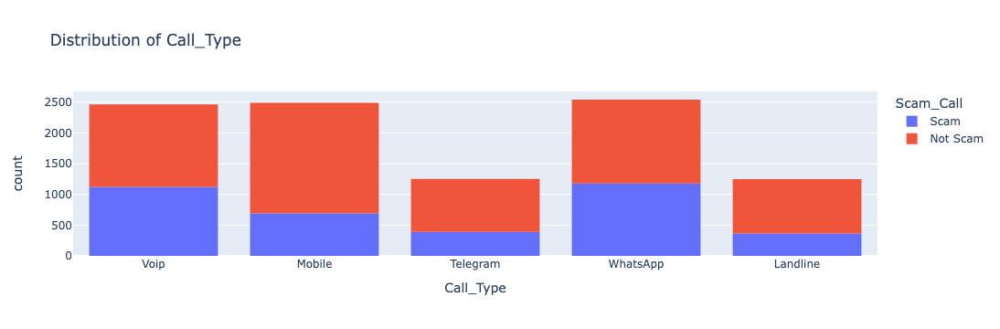

In [28]:
feature = 'Call_Type'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                  title = 'Distribution of ' + feature)

fig.show()

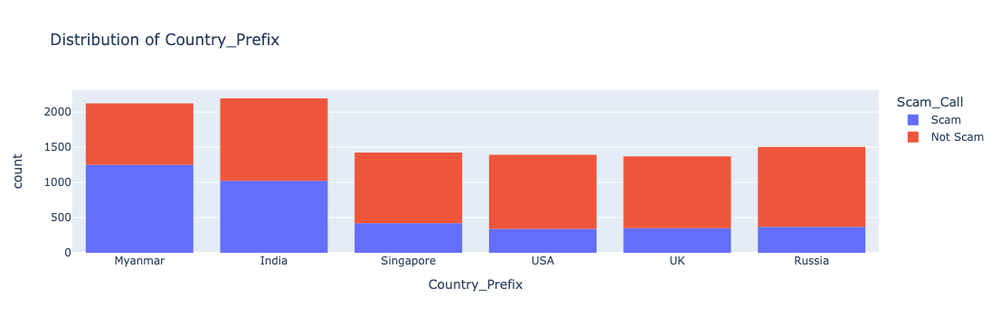

In [29]:
feature = 'Country_Prefix'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                  title = 'Distribution of ' + feature)

fig.show()

#### Tranforming to logarithm scale 

* Attempt to apply logarithm transformation for skewed data
* Little to No change to distribution of Call_Frequency and Previous_Contact_Count

In [ ]:
import numpy as np

df['Call_Frequencylog+1'] = (df['Call_Frequency']+1).transform(np.log)
df['Previous_Contact_Countlog+1'] = (df['Previous_Contact_Count']+1).transform(np.log)
df

In [ ]:
feature = 'Call_Frequencylog+1'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   # nbins = 12,
                  title = 'Distribution of ' + feature)

fig.show()

In [ ]:
feature = 'Previous_Contact_Countlog+1'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   # nbins = 12,
                  title = 'Distribution of ' + feature)

fig.show()

* Filling in Missing values in Financial Loss column with Mean
* Mean is chosen to avoid skewing the distribution

In [30]:
# Filling in missing data with mean
df['Financial_Loss'] = df['Financial_Loss'].fillna(df['Financial_Loss'].mean())

* Z-score normalization for Financial Loss
* This is chosen as taking absolute value or squaring the value will skew the distribution

In [31]:
# Z-score normalization or Standardization
df['Financial_Loss'] = (df['Financial_Loss'] - df['Financial_Loss'].mean()) / df['Financial_Loss'].std()

* Boxplot of Call_Duration revealed some outliers
* Removing them via percentile method

In [32]:
upper_lim = df['Call_Duration'].quantile(.95)
lower_lim = df['Call_Duration'].quantile(.05)

df[(df['Call_Duration'] < upper_lim) & (df['Call_Duration'] > lower_lim)]

,Call_Duration,Call_Frequency,Financial_Loss,Flagged_by_Carrier,Is_International,Previous_Contact_Count,Country_Prefix,Call_Type,Device_Battery,Scam_Call,Date,Time,Year,Month,Day
1,116,3,-3.749081e-01,Unlikely,Yes,0,India,Mobile,Fully Charged,Scam,2023-09-05,2024-04-29 20:11:00,2023,9,5
2,29,16,3.415637e+00,Very Suspicious,Yes,2,India,Voip,Charging,Scam,2023-12-16,2024-04-29 11:03:00,2023,12,16
4,312,19,-5.383220e-01,Unlikely,Yes,0,India,Telegram,Fully Charged,Scam,2023-11-10,2024-04-29 15:53:00,2023,11,10
5,-120,20,-5.383220e-01,Unlikely,Yes,1,UK,Mobile,Fully Charged,Not Scam,2023-12-29,2024-04-29 06:20:00,2023,12,29
6,590,21,1.530366e+00,Suspicious,Yes,1,Singapore,Telegram,Fully Charged,Scam,2024-01-02,2024-04-29 10:22:00,2024,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,298,9,-5.383220e-01,Unlikely,Yes,2,Russia,Telegram,Fully Charged,Not Scam,2023-05-02,2024-04-29 02:37:00,2023,5,2
9996,-322,6,7.766723e-17,Unlikely,Yes,0,Russia,Landline,Not Charging,Not Scam,2024-03-31,2024-04-29 07:55:00,2024,3,31
9997,28,6,-1.247448e-01,Unlikely,Yes,5,USA,Telegram,Charging,Not Scam,2024-03-01,2024-04-29 04:49:00,2024,3,1
9998,271,6,-4.801073e+00,Very Suspicious,Yes,3,Myanmar,Landline,Not Charging,Scam,2023-05-29,2024-04-29 21:59:00,2023,5,29


* Standardization of Call Duration
* Values in this column are numerical and might skew the feature weight if not processed

In [33]:
# Standardization
df['Call_Duration'] = (df['Call_Duration'] - df['Call_Duration'].min()) /(df['Call_Duration'].max() - df['Call_Duration'].min())

* Label Encoding of Binary Columns (Scam_Call and Is_International)

In [34]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

# "Scam" -> "1" 
# "Not Scam" -> "0"
df['Scam_Call'] = label_encoder.fit_transform(df['Scam_Call'])

# "Yes" -> "1" 
# "No" -> "0"
df['Is_International'] = label_encoder.fit_transform(df['Is_International'])

* One-Hot Encoding of Categorical Data via `.get_dummies(method)`
* To prevent feature weight skews when training models
* Applied to Device_Battery, Flagged_by_Carrier, Call_Type, Country_Prefix

In [35]:
# "Fully Charged" -> "1,0" 
# "Charging" -> "0,1"
# "Not Charging" -> "0,0"
device_battery_encoding = pd.get_dummies(df['Device_Battery'])
df = pd.concat([df, device_battery_encoding], axis=1)
df = df.drop(columns = ['Device_Battery','Not Charging'])

# "Suspicious" -> "1,0" 
# "Unlikely" -> "0,1"
# "Very Suspicious" -> "0,0"
carrier_encoding = pd.get_dummies(df['Flagged_by_Carrier'])
df = pd.concat([df, carrier_encoding], axis=1)
df = df.drop(columns = ['Flagged_by_Carrier', 'Very Suspicious'])


# "Landline" -> "1,0,0,0,0" 
# "Mobile" ->   "0,1,0,0,0"
# "Telegram" -> "0,0,1,0,0"
# "Voip" ->     "0,0,0,1,0" 
# "WhatsApp" -> "0,0,0,0,1"
# 0,0,0,0 can be representative of Whatsapp and therefore dropping WhatsApp column, 
call_type_encoding = pd.get_dummies(df['Call_Type'])
df = pd.concat([df, call_type_encoding], axis=1)
df = df.drop(columns = ['Call_Type','WhatsApp'])


# "India" ->     "1,0,0,0,0" 
# "Myanmar" ->   "0,1,0,0,0"
# "Russia" ->    "0,0,1,0,0"
# "Singapore" -> "0,0,0,1,0" 
# "UK" ->        "0,0,0,0,1"
# 0,0,0,0 can be representative of USA and therefore dropping USA column, 
country_encoding = pd.get_dummies(df['Country_Prefix'])
df = pd.concat([df, country_encoding], axis=1)
df = df.drop(columns = ['Country_Prefix','USA'])

* Binning of Data as it is categorical in nature however there are too many different values
* E.g 31 days in a month, if one-hot encoded, there will be 30 extra columns
* Performed via `.cut(method)`
* Applied onto Previous_Contact_Count, Call_Frequency and Month
* Original column is removed as information is "extracted"

In [36]:
df['Call_Frequency'] = pd.cut(df['Call_Frequency'], bins=[0,5,10,15,30], labels=["Low_Calls", "Mid_Calls", "High_Calls", "Very_High_Calls"])
df['Previous_Contact_Count'] = pd.cut(df['Previous_Contact_Count'], bins=[0,2,4,8], labels=["Low_Contact", "Mid_Contact", "High_Contact"])
df['Month'] = pd.cut(df['Month'], bins=[0,3,6,9,12], labels=["Q1", "Q2", "Q3","Q4"])

contact_encoding = pd.get_dummies(df['Previous_Contact_Count'])
df = pd.concat([df, contact_encoding], axis=1)
df = df.drop(columns = ['Previous_Contact_Count','High_Contact'])

freq_encoding = pd.get_dummies(df['Call_Frequency'])
df = pd.concat([df, freq_encoding], axis=1)
df = df.drop(columns = ['Call_Frequency','Very_High_Calls'])

month_encoding = pd.get_dummies(df['Month'])
df = pd.concat([df, month_encoding], axis=1)
df = df.drop(columns = ['Month','Q4'])

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Call_Duration     10000 non-null  float64       
 1   Financial_Loss    10000 non-null  float64       
 2   Is_International  10000 non-null  int64         
 3   Scam_Call         10000 non-null  int64         
 4   Date              10000 non-null  datetime64[ns]
 5   Time              10000 non-null  datetime64[ns]
 6   Year              10000 non-null  int64         
 7   Day               10000 non-null  int64         
 8   Charging          10000 non-null  uint8         
 9   Fully Charged     10000 non-null  uint8         
 10  Suspicious        10000 non-null  uint8         
 11  Unlikely          10000 non-null  uint8         
 12  Landline          10000 non-null  uint8         
 13  Mobile            10000 non-null  uint8         
 14  Telegram          10000

#### Splitting of Timestamp column into Date and Time

Observations of 'Month_of_call':
* Majority of the calls happen in the 1st quarter. 
* Proportion of Scam and Not Scam are similar throughtout the months.

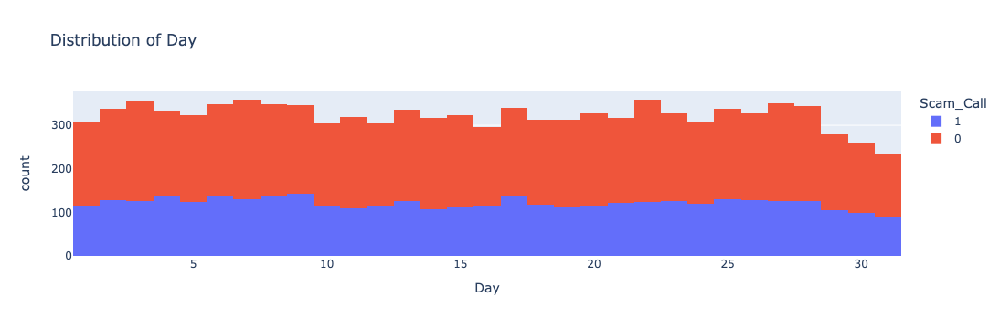

In [40]:
feature = 'Day'

fig = px.histogram(df, x = feature,
                  color = 'Scam_Call',
                   # nbins = 3,
                  title = 'Distribution of ' + feature)

fig.show()

* Changing data type

In [42]:
df['Is_International'] = df.Is_International.astype('category')
df['Scam_Call'] = df.Scam_Call.astype('category')
df['Fully Charged'] = df['Fully Charged'].astype('category')
df['Suspicious'] = df.Suspicious.astype('category')
df['Unlikely'] = df.Unlikely.astype('category')
df['Landline'] = df.Landline.astype('category')
df['Mobile'] = df.Mobile.astype('category')
df['Telegram'] = df.Telegram.astype('category')
df['Voip'] = df.Voip.astype('category')
df['India'] = df.India.astype('category')
df['Myanmar'] = df.Myanmar.astype('category')
df['Russia'] = df.Russia.astype('category')
df['Singapore'] = df.Singapore.astype('category')
df['UK'] = df.UK.astype('category')
df['Charging'] = df.Charging.astype('category')
df['Low_Contact'] = df['Low_Contact'].astype('category')
df['Mid_Contact'] = df['Mid_Contact'].astype('category')
df['Low_Calls'] = df['Low_Calls'].astype('category')
df['Mid_Calls'] = df['Mid_Calls'].astype('category')
df['High_Calls'] = df['High_Calls'].astype('category')
df['Q1'] = df['Q1'].astype('category')
df['Q2'] = df['Q2'].astype('category')
df['Q3'] = df['Q3'].astype('category')
# df['Fully Charged'] = df['Fully Charged'].astype('category')



# df['Date'] = pd.to_datetime(df['Date'], format="%Y-%m-%d")
df['Year_of_call'] = pd.to_datetime(df['Year_of_call'])
df['Month_of_call'] = pd.to_datetime(df['Month_of_call'])
df['Day_of_call'] = pd.to_datetime(df['Day_of_call'])

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 32 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Call_Duration     10000 non-null  float64       
 1   Financial_Loss    10000 non-null  float64       
 2   Is_International  10000 non-null  category      
 3   Scam_Call         10000 non-null  category      
 4   Date              10000 non-null  datetime64[ns]
 5   Time              10000 non-null  datetime64[ns]
 6   Year              10000 non-null  int64         
 7   Day               10000 non-null  int64         
 8   Charging          10000 non-null  category      
 9   Fully Charged     10000 non-null  category      
 10  Suspicious        10000 non-null  category      
 11  Unlikely          10000 non-null  category      
 12  Landline          10000 non-null  category      
 13  Mobile            10000 non-null  category      
 14  Telegram          10000

# Model Training

* Splitting and training of dataset

In [ ]:
from sklearn.model_selection import train_test_split

#Selection of features and Output as Scam_Call

features = ['Call_Duration', 'Financial_Loss', 'Is_International',
       'Charging',
       'Fully Charged', 'Suspicious', 'Unlikely', 'Landline', 'Mobile',
       'Telegram', 'Voip', '44', '65', '7', '91', '95', 'Low_Contact',
       'Mid_Contact', 'Low_Calls', 'Mid_Calls', 'High_Calls','Q1', 'Q2', 'Q3']
          # 'Call_Frequencylog+1', 'Previous_Contact_Countlog+1']

X = df[features]
y = df['Scam_Call']

# Splitting data in a 70:30 fashion.

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

#### Splitting of Data

In [ ]:
X = df[features]
y = df['Scam_Call']

# Splitting data in a 70:30 fashion.

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

#### Scaling of data

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Logistic Regression Model

In [ ]:
import math  
import sklearn.metrics as metrics
from sklearn.linear_model import LogisticRegression

# Instantiate Model
logreg_model = LogisticRegression(max_iter = 300)

# Fit the model with training data
logreg_model = logreg_model.fit(X_train_scaled, y_train)

# Obtain Predictions 
logreg_y_predict = logreg_model.predict(X_test_scaled)


print('AUC:', metrics.roc_auc_score(y_test, logreg_y_predict))
print(metrics.accuracy_score(y_test, logreg_y_predict))

In [ ]:
confusion = metrics.confusion_matrix(y_test, logreg_y_predict)
print(confusion)

In [ ]:
confusion = metrics.confusion_matrix(y_test, logreg_y_predict)
print(confusion)
print(metrics.recall_score(y_test, logreg_y_predict))


In [ ]:
y_pred_probabilities = logreg_model.predict_proba(X)
y_pred_probabilities_formatted = y_pred_probabilities[:, 1]


import plotly.express as px
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from sklearn.datasets import make_classification

# Calculate the (1) false positive rate, (2) true positive rate, and (3) thresholds
y_pred_probabilities_formatted = list(y_pred_probabilities_formatted) # converting to list
fpr, tpr, thresholds = roc_curve(y, y_pred_probabilities_formatted)

# Plotting the chart
fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)

# This part is just for formatting & adding the dash-line 
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')


fig.show()

### XGBoost Model

In [ ]:
import xgboost as xgb
xgb_model = xgb.XGBClassifier(learning_rate=0.1, max_depth=3, random_state=3)

# Fit the model with the training data
xgb_model.fit(X_train_scaled, y_train)

# predict the target on the test dataset
xgb_y_predict = xgb_model.predict(X_test_scaled)
print('\nPrediction on test data', xgb_y_predict) 

# Accuracy Score on test dataset
print('AUC:', metrics.roc_auc_score(y_test, xgb_y_predict))

In [ ]:
confusion = metrics.confusion_matrix(y_test, xgb_y_predict)
print(confusion)
print(metrics.recall_score(y_test, xgb_y_predict))

### CatBoost Model

In [ ]:
from catboost import CatBoostClassifier

cat_model = CatBoostClassifier(learning_rate=0.1, depth = 3, random_seed=5)

# Fit the model with the training data
cat_model.fit(X_train_scaled, y_train)

# predict the target on the test dataset
cat_y_predict = cat_model.predict(X_test_scaled)
print('\nPrediction on test data', cat_y_predict) 

# Accuracy Score on test dataset
print('AUC:', metrics.roc_auc_score(y_test, cat_y_predict))

In [ ]:
confusion = metrics.confusion_matrix(y_test, cat_y_predict)
print(confusion)
print(metrics.recall_score(y_test, cat_y_predict))

### Hyperparameter Tuning

* For XGB
* Learning rate = 0.1, max_depth = 0.3

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [3,5,7,9],
    'eta': [0.01,0.1, 0.3, 0.5]
}

grid_search = GridSearchCV(estimator=xgb.XGBClassifier(), param_grid=param_grid, cv=10)
grid_search.fit(X_train_scaled, y_train)

In [ ]:
# Get the best estimator
best_estimator = grid_search.best_estimator_

# Get the best hyperparameters
best_params = grid_search.best_params_

print(best_estimator)
print()
print(best_params)


* For Catboost
* Learning rate = 0.1 depth =3 

In [ ]:
param_grid = {
    'depth': [3,6,9],
    'learning_rate': [0.01,0.1,0.5]
}

grid_search = GridSearchCV(estimator=CatBoostClassifier(), param_grid=param_grid, cv=10)
grid_search.fit(X_train_scaled, y_train)

### Exporting Model

* Exporting .pkl file allows subsequent deployment endeavours
* Such as containerization with dockers
* .pkl file can used to generate a prediction when presented with feature data.

In [ ]:
from pathlib import Path

Path("../model").mkdir(exist_ok=True)

In [ ]:
import joblib

export_model = cat_model

joblib.dump(export_model, '../cat_model.pkl')